In [1]:
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 15873, done.
remote: Counting objects: 100% (40/40), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 15873 (delta 13), reused 24 (delta 8), pack-reused 15833 (from 1)
Receiving objects: 100% (15873/15873), 14.50 MiB | 6.11 MiB/s, done.
Resolving deltas: 100% (10679/10679), done.


In [2]:
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile

/content/darknet


In [3]:
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


In [4]:
!make

mkdir -p ./obj/
mkdir -p backup
mkdir -p results
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -rdynamic -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:945:23: warning: variable ‘rgb’ set but not used []8;;https://gcc.gnu.org/onlinedocs/gcc/Warning-Options.html#index-Wunused-but-set-variable-Wunused-but-set-variable]8;;]
  945 |                 float rgb[3];
      |                       ^~~
./src/image_opencv.cpp: In function ‘void cv_draw_object(image, float*, int, int, int*, float*, int*, int, char**)’:
./src/image_opencv.cpp:1443:14: warning: unused variable ‘bu

In [7]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2024-11-17 10:30:37--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  5.66MB/s    in 26s     

2024-11-17 10:31:05 (8.96 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [22]:
def imShow(path):
    import cv2
    import matplotlib.pyplot as plt
    %matplotlib inline

    image = cv2.imread(path)
    height, width = image.shape[:2]
    resized_image = cv2.resize(image, (3*width, 3*height), interpolation = cv2.INTER_CUBIC)

    fig = plt.gcf()
    fig.set_size_inches(18, 10)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
    plt.show()

In [8]:
def upload():
  from google.colab import files
  uploaded = files.upload()
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print('saved file', name)

In [9]:
def download(path):
  from google.colab import files
  files.download(path)

In [14]:
#darknet detection 을 실행하기
!./darknet detect cfg/yolov3.cfg yolov3.weights data/person.jpg

 CUDA-version: 12020 (12020), cuDNN: 8.9.6, GPU count: 1  
 OpenCV version: 4.5.4
 0 : compute_capability = 750, cudnn_half = 0, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  

In [16]:
import cv2
import matplotlib.pyplot as plt

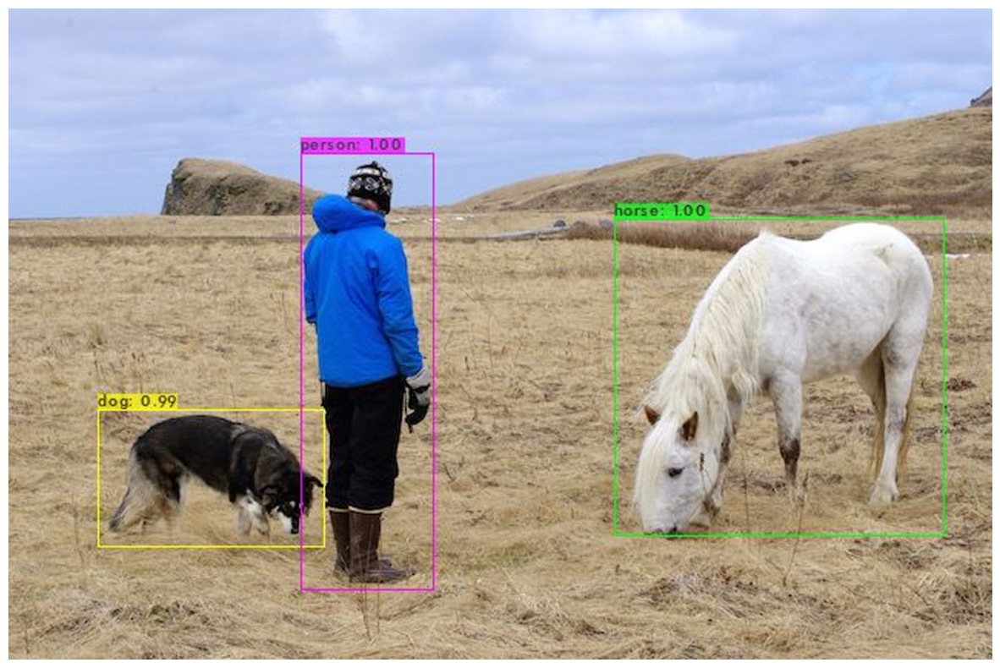

In [23]:
#결과 영상을 보여주기
imShow('predictions.jpg')

 CUDA-version: 12020 (12020), cuDNN: 8.9.6, GPU count: 1  
 OpenCV version: 4.5.4
 0 : compute_capability = 750, cudnn_half = 0, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  

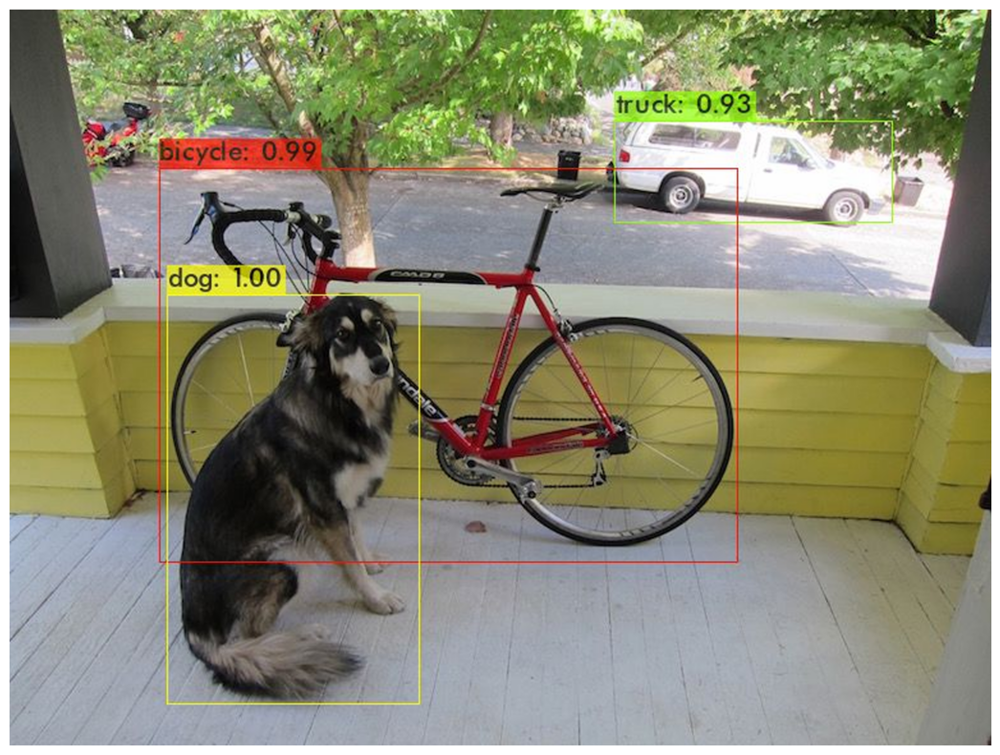

In [24]:
#dog.jpg에 대해서도 실행시켜보기
!./darknet detect cfg/yolov3.cfg yolov3.weights data/dog.jpg
imShow('predictions.jpg')

In [35]:
# roboflow에서 제공하는 images 받아오기
!curl -L "https://public.roboflow.com/ds/0Q4TDaIgXT?key=v8qXdebOxZ" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
 extracting: export/labels/1478900099595044482_jpg.rf.Y48Kh5UJNyBAWFTA0w0y.txt  
 extracting: export/labels/1478900100165707353_jpg.rf.02dae94790fe0a5fd8145e6582060381.txt  
 extracting: export/labels/1478900100165707353_jpg.rf.mLJlW3Cf3VoVKjXY6jgh.txt  
 extracting: export/labels/1478900100737478288_jpg.rf.2bb35a1222e15394de7033687f69065c.txt  
 extracting: export/labels/1478900100737478288_jpg.rf.nbrgBfnnhHP0mwGGKfnW.txt  
 extracting: export/labels/1478900101309115339_jpg.rf.2508668be11307c87ff954cf21544d10.txt  
 extracting: export/labels/1478900101309115339_jpg.rf.OsDb7MLdxcxdujSvvLyR.txt  
 extracting: export/labels/1478900101879688623_jpg.rf.81c3be06336e0ae02178f47713d58e6f.txt  
 extracting: export/labels/1478900101879688623_jpg.rf.v2nxcO0TVyrQn6VcGa1D.txt  
 extracting: export/labels/1478900102451943901_jpg.rf.4kwTUlpUEj4Jc9ubppWJ.txt  
 extracting: export/labels/1478900102451943901_jpg.rf.bb6b07a82d52b84fdcc5593bc581128c.txt  
 extracting: 

In [36]:
# yolov5 clone 해오기
%cd /content
!git clone https://github.com/ultralytics/yolov5.git

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 17045, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 17045 (delta 10), reused 18 (delta 8), pack-reused 17022 (from 1)
Receiving objects: 100% (17045/17045), 15.66 MiB | 8.86 MiB/s, done.
Resolving deltas: 100% (11700/11700), done.


In [37]:
#필요한 라이브러리를 설치해주기
%cd /content/yolov5/
!pip install -r requirements.txt

/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.0/887.0 kB 46.6 MB/s eta 0:00:00


In [87]:
%cat /content/dataset/export/data.yaml

names:
- biker
- car
- pedestrian
- trafficLight
- trafficLight-Green
- trafficLight-GreenLeft
- trafficLight-Red
- trafficLight-RedLeft
- trafficLight-Yellow
- trafficLight-YellowLeft
- truck
nc: 11
roboflow:
  license: MIT
  project: self-driving-car
  url: https://universe.roboflow.com/roboflow-gw7yv/self-driving-car/dataset/3
  version: 3
  workspace: roboflow-gw7yv
test: ../test/images
train: /content/dataset/export/train.txt
val: /content/dataset/export/val.txt


In [47]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [88]:
%cd /export
from glob import glob

img_list = glob('/content/dataset/export/images/*.jpg')
print(len(img_list))

[Errno 2] No such file or directory: '/export'
/root
29800


In [89]:
# train, test data 나누기
from sklearn.model_selection import train_test_split

train_img_list, val_img_list = train_test_split(img_list, test_size=0.2, random_state=2000)

print(len(train_img_list), len(val_img_list))

23840 5960


In [90]:
with open('/content/dataset/train.txt', 'w') as f: # write
  f.write('\n'.join(train_img_list) + '\n')

with open('/content/dataset/val.txt', 'w') as f: # write
  f.write('\n'.join(val_img_list) + '\n')

In [91]:
import yaml

with open('/content/dataset/data.yaml', 'r') as f: #read
  data = yaml.safe_load(f) # 문자열 -> 파이썬데이터로

print(data)

data['train'] = '/content/dataset/train.txt'
data['val'] = '/content/dataset/val.txt'

with open('/content/dataset/data.yaml', 'w') as f: #write
  yaml.dump(data, f) # 파이썬데이터 -> yaml 형태로

print(data)

{'names': ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck'], 'nc': 11, 'roboflow': {'license': 'MIT', 'project': 'self-driving-car', 'url': 'https://universe.roboflow.com/roboflow-gw7yv/self-driving-car/dataset/3', 'version': 3, 'workspace': 'roboflow-gw7yv'}, 'test': '../test/images', 'train': '/content/dataset/export/train.txt', 'val': '/content/dataset/export/val.txt'}
{'names': ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck'], 'nc': 11, 'roboflow': {'license': 'MIT', 'project': 'self-driving-car', 'url': 'https://universe.roboflow.com/roboflow-gw7yv/self-driving-car/dataset/3', 'version': 3, 'workspace': 'roboflow-gw7yv'}, 'test': '../test/images', 'train': '/content/dataset/train.txt', 'va

In [94]:
%cd /content/yolov5/

!python train.py --img 416 --batch 32 --epochs 3 --data /content/dataset/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name self_driving_car_yolov5_result

/content/yolov5
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-11-17 12:56:12.042142: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-17 12:56:12.070350: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-17 12:56:12.078623: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb:

In [95]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 40048), started 0:31:14 ago. (Use '!kill 40048' to kill it.)

<IPython.core.display.Javascript object>